In [83]:
import numpy as np
import tensorflow as tf

import os

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Load data from full simulations

In [3]:
def load_multiple_records(file_path):
    with open(file_path, 'r') as file:
        lines = file.readlines()
    
    records = []
    current_record = []
    header = lines[0].strip()  # Assuming the first line is the header
    
    for line in lines:
        if line.strip() == header:
            if current_record:
                records.append(np.array(current_record, dtype=float))
                current_record = []
        else:
            current_record.append([float(value) for value in line.split()])
    
    if current_record:  # Add the last record if the file doesn't end with a header line
        records.append(np.array(current_record, dtype=float))
    
    return records

In [51]:
# Folder path where the files are stored
folder_path = r'C:\Users\joses\Mi unidad\TRABAJO\48_FG_protection\TRABAJO\fgp_optimizer\optimization_simple_plastic\full_simulation_data\iter0'

# Dictionary to store the data for each node
data_dicts = {}
node_ids = []
nodes = np.loadtxt(os.path.join(folder_path, 'nodos.txt'))[:, 1:]

# Iterate over each file in the folder
for filename in os.listdir(folder_path):
    if filename.startswith('presion_node'):
        # Extract the node ID from the filename
        node_id = filename.split(' ')[-1]
        node_ids.append(node_id)
        
        # Construct the full file path
        file_path = os.path.join(folder_path, filename)
        
        # Load the data, skipping the first line
        data = load_multiple_records(file_path)
        
        # Store the time and pressure data in the dictionary under the node_id
        data_dicts[node_id] = {
            'time': data[0][:, 0],
            'pressure': np.mean(np.array(data), axis=0)[:,1],
            'displacement': np.loadtxt(file_path.replace('presion_node ', 'flecha_node'), skiprows=1)[:, 1], 
            'coordinates': nodes[int(node_id)]
        }


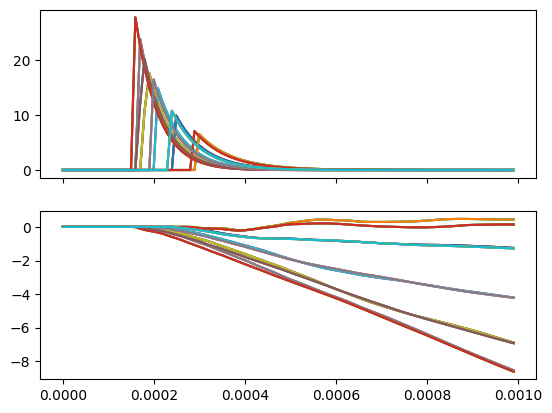

In [106]:
fig, ax = plt.subplots(2, 1, sharex='col')
ax = ax.flatten()

n_rows = 100
for node_id in node_ids:
    ax[0].plot(data_dicts[node_id]['time'][:n_rows], data_dicts[node_id]['pressure'][:n_rows])
    ax[1].plot(data_dicts[node_id]['time'][:n_rows], data_dicts[node_id]['displacement'][:n_rows])

plt.show()


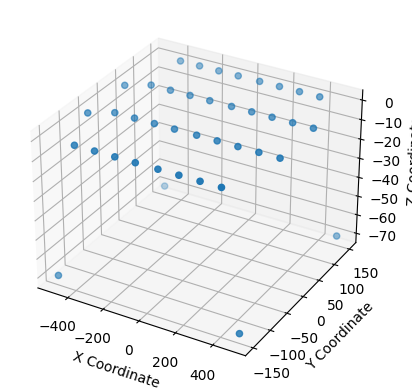

In [107]:
coordinates = np.array([data_dicts[node_id]['coordinates'] for node_id in node_ids])

# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(coordinates[:, 0], coordinates[:, 1], coordinates[:, 2])

# Set labels (optional)
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_zlabel('Z Coordinate')

plt.show()

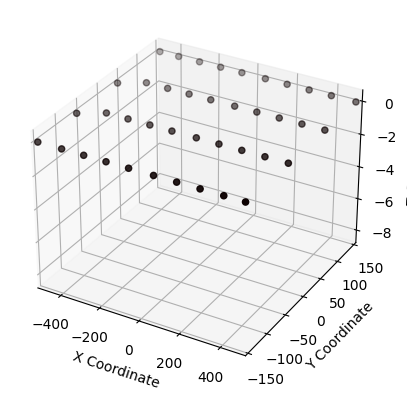

In [109]:
stride = 1

# Assuming data_dicts and node_ids are already defined
coordinates = np.array([data_dicts[node_id]['coordinates'] for node_id in node_ids])
displacement_data = np.array([data_dicts[node_id]['displacement'][:n_rows] for node_id in node_ids])
pressure_data = np.array([data_dicts[node_id]['pressure'][:n_rows] for node_id in node_ids])

# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Initialize scatter plot
scat = ax.scatter(coordinates[:, 0], coordinates[:, 1], coordinates[:, 2])

# Set labels (optional)
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_zlabel('Z Coordinate')

# Function to update the scatter plot
def update(frame):
    ax.clear()
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    ax.set_zlabel('Z Coordinate')
    ax.set_xlim([coordinates[:, 0].min(), coordinates[:, 0].max()])
    ax.set_ylim([coordinates[:, 1].min(), coordinates[:, 1].max()])
    ax.set_zlim([displacement_data.min(), displacement_data.max()])
    ax.scatter(coordinates[:, 0], coordinates[:, 1], displacement_data[:, frame], c=pressure_data[:, frame], cmap='hot')
    return scat,

# Create the animation
ani = FuncAnimation(fig, update, frames=range(0, len(displacement_data[0]), stride), interval=1000/25, blit=False)

HTML(ani.to_jshtml())


## Plot for inspection

In [ ]:
class SDOFModel(tf.keras.Model):
    def __init__(self, delta_t, n, weight_xr: float = 0.5, weight_xrdot: float = 0.5, 
                 linear_projection: bool = True):
        super(SDOFModel, self).__init__()
        
        self.delta_t = delta_t
        self.n = n  # Dimension of each vector part
        
        # Dense layer to act as the shared Phi matrix for all 3 vectors
        if linear_projection:
            self.shared_dense_layer = tf.keras.layers.Dense(1, activation='linear')  # Linear activation for matrix multiplication
        else:
            raise NotImplementedError
        
        # Trainable parameters ms, ks, and cs
        self.ms = tf.Variable(1.0, dtype=tf.float32, trainable=True, name="mass")
        self.ks = tf.Variable(1.0, dtype=tf.float32, trainable=True, name="stiffness")
        self.cs = tf.Variable(0.1, dtype=tf.float32, trainable=True, name="damping")
        
        self.weight_xr = weight_xr
        self.weight_xrdot = weight_xrdot

    def call(self, inputs):
        # Inputs: xr_k, xrdot_k, fr_k
        xr_k, xrdot_k, fr_k = inputs
        
        # Split input vectors into 3 n-element vectors
        xr_k = tf.reshape(xr_k, (-1, self.n))  # Reshape into n-dimensional vector
        xrdot_k = tf.reshape(xrdot_k, (-1, self.n))
        fr_k = tf.reshape(fr_k, (-1, self.n))
        
        # Apply the same matrix (dense layer) to all 3 vectors
        x_k = self.shared_dense_layer(xr_k)  # Result is a scalar for x_k
        xdot_k = self.shared_dense_layer(xrdot_k)  # Scalar for xdot_k
        f_k = self.shared_dense_layer(fr_k)  # Scalar for f_k
        
        # 2. Define the matrices A and B based on a discrete-time system
        A_d = tf.stack([[1.0,                                   self.delta_t],
                        [-(self.ks / self.ms) * self.delta_t,   1.0 - (self.cs / self.ms) * self.delta_t]], 
                        axis=0)

        B_d = tf.stack([0.0, 
                        self.delta_t / self.ms], 
                        axis=0)
        
        # State at time step k
        state_k = tf.stack([x_k, 
                            xdot_k], 
                            axis=-1)
        
        # Compute next state x_{k+1}, xdot_{k+1}
        state_k_plus_1 = tf.matmul(A_d, state_k) + B_d * f_k
        
        x_k_plus_1 = state_k_plus_1[:, 0]
        xdot_k_plus_1 = state_k_plus_1[:, 1]
        
        # 3. Use an MLP to transform scalars back to vectors
        # Assuming a simple MLP transformation for this step
        xr_k_plus_1 = tf.tile(x_k_plus_1, [1, self.n])
        xrdot_k_plus_1 = tf.tile(xdot_k_plus_1, [1, self.n])
        
        return xr_k_plus_1, xrdot_k_plus_1




class SDOFModel(tf.keras.Model):
    def __init__(self, delta_t: float, weight_xr: float = 0.5, weight_xrdot: float = 0.5, 
                 linear_transform: bool = True):
        super(SDOFModel, self).__init__()
        
        self.delta_t = delta_t
        
        # MLP to transform vectors to scalars and vice versa
        if linear_transform:
            self.vector_to_scalar_mlp = tf.keras.layers.Dense(3, activation='linear')
        else:
            raise NotImplementedError
        
        self.scalar_to_vector_mlp = tf.keras.Sequential([
            tf.keras.layers.Dense(64, activation='relu'),
            tf.keras.layers.Dense(10)  # Output size matches the vector input shape
        ])
        
        # Trainable parameters ms, ks, and cs
        self.ms = tf.Variable(1.0, dtype=tf.float32, trainable=True, name="mass")
        self.ks = tf.Variable(1.0, dtype=tf.float32, trainable=True, name="stiffness")
        self.cs = tf.Variable(0.1, dtype=tf.float32, trainable=True, name="damping")
        
        self.weight_xr = weight_xr
        self.weight_xrdot = weight_xrdot

    def call(self, inputs):
        # Inputs: xr_k, xrdot_k, fr_k
        xr_k, xrdot_k, fr_k = inputs
        
        # 1. Use MLP to transform vectors to scalars
        scalars = self.vector_to_scalar_mlp(tf.concat([xr_k, xrdot_k, fr_k], axis=-1))
        x_k, xdot_k, f_k = tf.split(scalars, num_or_size_splits=3, axis=-1)
        
        # 2. Define the matrices A and B based on a discrete-time system
        A_d = tf.stack([
            [1.0, self.delta_t],
            [-self.ks / self.ms * self.delta_t, 1.0 - self.cs / self.ms * self.delta_t]
        ], axis=0)

        B_d = tf.stack([0.0, self.delta_t / self.ms], axis=0)
        
        # State at time step k
        state_k = tf.stack([x_k, xdot_k], axis=-1)
        
        # Compute next state x_{k+1}, xdot_{k+1}
        next_state = tf.matmul(A_d, state_k) + B_d * f_k
        
        x_k_plus_1 = next_state[:, 0]
        xdot_k_plus_1 = next_state[:, 1]
        
        # 3. Use MLP to transform scalars back to vectors
        xr_k_plus_1 = self.scalar_to_vector_mlp(x_k_plus_1)
        xrdot_k_plus_1 = self.scalar_to_vector_mlp(xdot_k_plus_1)
        
        return xr_k_plus_1, xrdot_k_plus_1